In [1]:
using DifferentialEquations
# using StatsPlots
using Plots
using PyCall
np = pyimport("numpy")

PyObject <module 'numpy' from '/Users/rosita/.julia/conda/3/lib/python3.7/site-packages/numpy/__init__.py'>

- The Lorenz equation with additive noise is just the deterministic portion plus some additive noise, 
- here the 3.0 in `σ_lorenz` is simply 3*N(0, dt) where N is the normal distribution, dt is the time step (in previous code, iters). 
- The code in the documentation looked like: (can be found under [Stochastic Differential Equations](https://docs.sciml.ai/v6.12/tutorials/sde_example/#Stochastic-Differential-Equations-1)

In [2]:
# JULIA DOCUMENTATION OF DIFFEQ********************************
function lorenz(du,u,p,t)
  du[1] = 10.0(u[2]-u[1])
  du[2] = u[1]*(28.0-u[3]) - u[2]
  du[3] = u[1]*u[2] - (8/3)*u[3]
end

function σ_lorenz(du,u,p,t)
  du[1] = 3.0
  du[2] = 3.0
  du[3] = 3.0
end

σ_lorenz (generic function with 1 method)

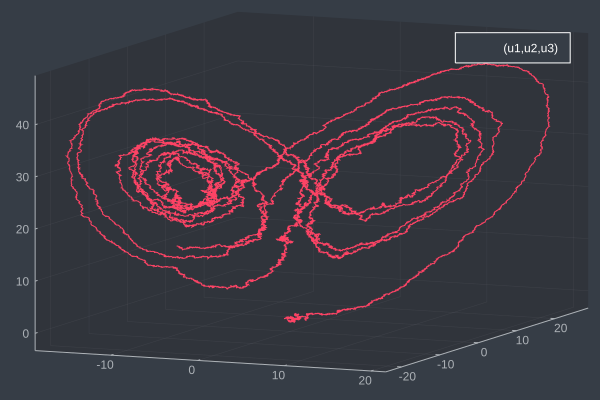

In [9]:
prob_sde_lorenz = SDEProblem(lorenz,σ_lorenz,[1.0,0.0,0.0],(0.0,10.0))
sol = solve(prob_sde_lorenz)
theme(:dark)
plot(sol,vars=(1,2,3))

Define SDE with σ

In [10]:
k1 = 0.35
k2 = 250
k3 = 0.035
k4 = 20
k5 = 5.35
k6 = 10^(-5)
k7 = 0.8
k_7 = 0.1
k8 = 0.825

function bz(du,u,p,t)
    a,b,x,y = u
    du[1] = -k3*a*b*y + k7 - k_7*a
    du[2] = -k3*a*b*y - k1*b*x + k8
    du[3] = k1*b*x - 2*k2*x^2 + 3*k3*a*b*y-k4*x+k6
    du[4] = -k3*a*b*y + 2*k2*x^2 - k5*y
end

function σ_bz(du, u, p, t)
    du[1] = σ
    du[2] = σ
    du[3] = σ
    du[4] = σ
end

σ_bz (generic function with 1 method)

In [4]:
function jacobian(v)
    a,b,x,y = v
    return ([-k3*b*y-k_7, 
            -k3*a*y-k1*x, 
            k1*b-4*k2*x-k4,  
            -k3*a*b-k5])
end

jacobian (generic function with 1 method)

starting initial conditions chosen to be identical to the original lyapunov calculations across k_range -> will compare point-wise

In [5]:
uo = [5.71384577, 2.59539651, 4.73372098, 2.89205437]
σ = 1e-4
sde_bz = SDEProblem(bz,σ_bz,uo, (0.0,5000.0),alg_hints=[:stiff])
sol_sde = solve(sde_bz);

new SDE

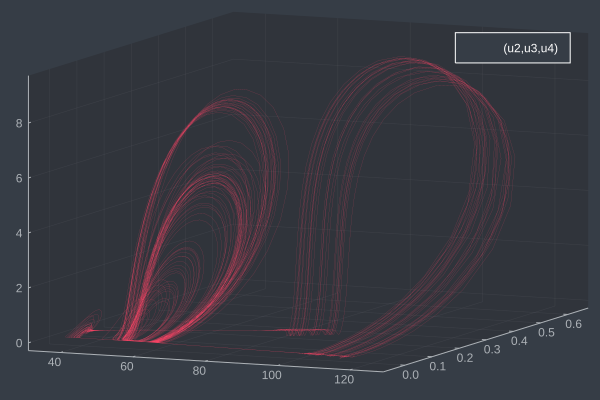

In [8]:
theme(:dark)
plot(sol_sde[3000:end],vars=(2,3,4),linewidth=0.1,)#zlims=(0,10)) # or vars=(1,3,4)

original ODE

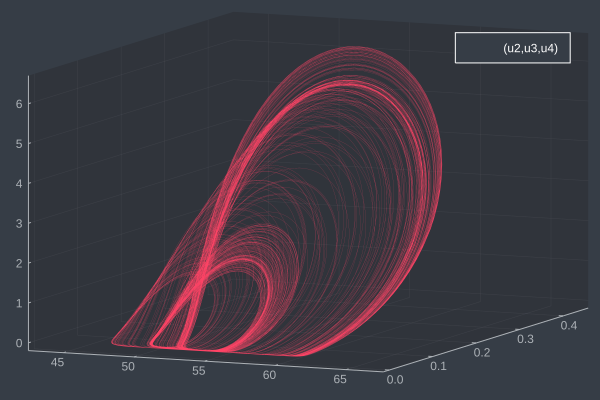

In [9]:
ode_bz = ODEProblem(bz, uo, (0.0,5000.0),)
sol_ode = solve(ode_bz)
plot(sol_ode[3000:end],vars=(2,3,4),linewidth=0.1)

Both together:

In [89]:
plot!(sol_sde[3000:end],vars=(2,3,4),linewidth=0.1)

Lyapunov comparison for this orbit:


In [91]:
fF_sde = np.transpose(np.log(np.abs(map(jacobian, sol_sde.u))))
lyaps_sde = [sum(fF_sde[i,:])/length(fF_sde[i,:]) for i in 1:4]

4-element Array{Float64,1}:
  0.4477356499152453
 -3.367137372669957 
  4.267687243373834 
  2.34855309328533  

In [114]:
fF_ode = np.transpose(np.log(np.abs(map(jacobian, sol_ode.u))))
lyaps_ode = [sum(fF_ode[i,:])/length(fF_ode[i,:]) for i in 1:4]

4-element Array{Float64,1}:
 -0.9858943383222109
 -4.179937357239102 
  3.012364203443866 
  2.190667969402615 

# changing initial condition

In [18]:
using Random

In [92]:
vo = Base.rand(4)*100 # changing initial condition
sde_bz = SDEProblem(bz,σ_bz,vo, (0.0,5000.0),)
sol_sde = solve(sde_bz);

ode_bz = ODEProblem(bz, vo, (0.0,5000.0),)
sol_ode = solve(ode_bz);

In [93]:
theme(:lime)
plot(sol_ode[3000:end],vars=(2,3,4),linewidth=0.1,zlims=(0,10))
plot!(sol_sde[3000:end],vars=(2,3,4),linewidth=0.1,zlims=(0,10))

# Changing k1

In [97]:
vo = Base.rand(4)*100 # changing initial condition
σ = 1e-4
k1 = 0.6

sde_bz = SDEProblem(bz,σ_bz,vo, (0.0,1000.0))
sol_sde = solve(sde_bz);

ode_bz = ODEProblem(bz, vo, (0.0,1000.0),)
sol_ode = solve(ode_bz);

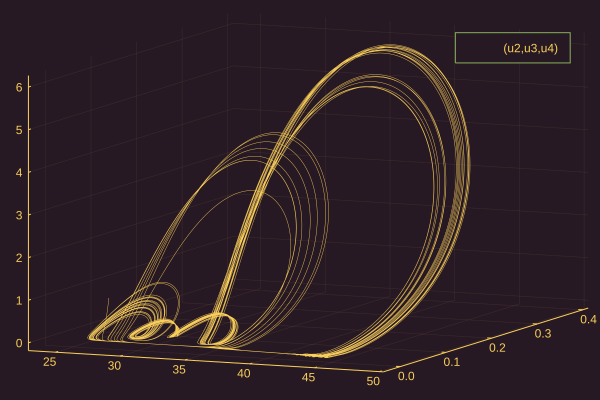

In [97]:
theme(:orange)
plot(sol_sde[3000:end],vars=(2,3,4),linewidth=.4) # or vars=(1,3,4)

In [26]:
# animation
# p = plot3d(1, linewidth=.4, xlims=(0,500),ylims=(0,0.5),zlims=(0,10))
# @gif for i in 1:20000
#     push!(p, sol_sde.u[i+3000][2], sol_sde.u[i+3000][3], sol_sde.u[i+3000][4])
# end every 500

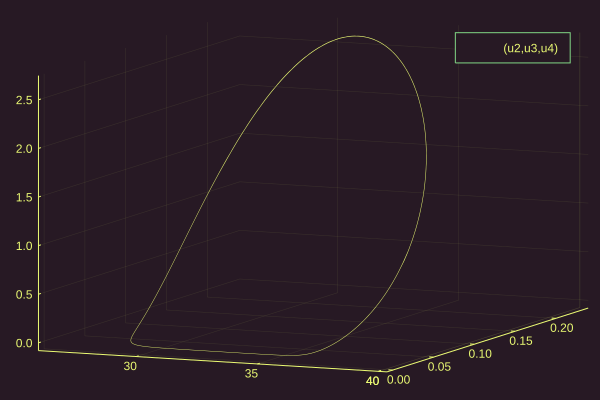

In [95]:
plot(sol_ode[3000:end],vars=(2,3,4),linewidth=0.4,)

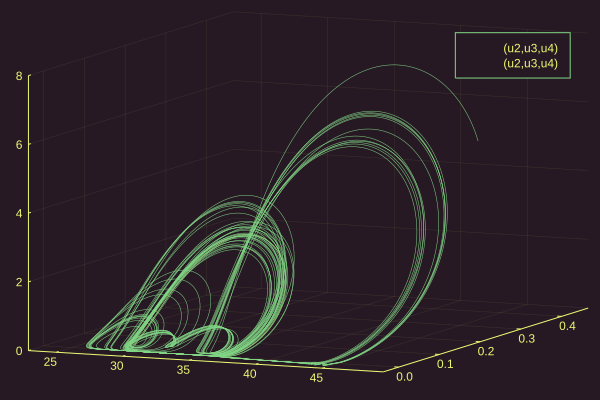

In [96]:
plot!(sol_sde[5000:end],vars=(2,3,4),linewidth=0.5,zlims=(0,8))

In [115]:
fF = np.transpose(np.log(np.abs(map(jacobian, sol_sde.u))))
lyaps = [sum(fF[i,:])/length(fF[i,:]) for i in 1:4]

4-element Array{Float64,1}:
 -0.18848080689629104
 -2.906705759499536  
  4.167054518124058  
  2.1729595048459864 

In [116]:
fF = np.transpose(np.log(np.abs(map(jacobian, sol_ode.u))))
lyaps = [sum(fF[i,:])/length(fF[i,:]) for i in 1:4]

4-element Array{Float64,1}:
 -0.9858943383222109
 -4.179937357239102 
  3.012364203443866 
  2.190667969402615 

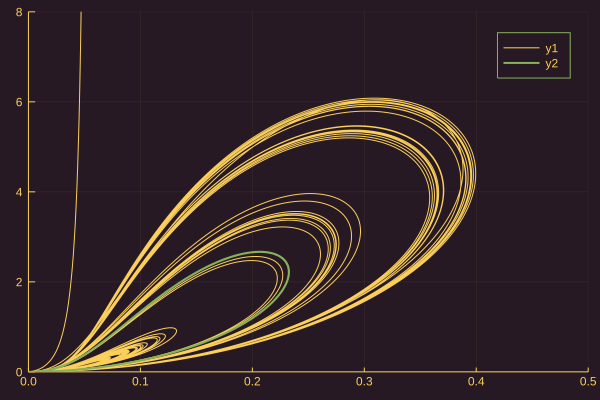

In [99]:
theme(:orange)
plot(np.transpose(sol_sde.u)[3,1000:end], np.transpose(sol_sde.u)[4,1000:end],xlims=(0,0.5),ylims=(0,8))
plot!(np.transpose(sol_ode.u)[3,1000:end], np.transpose(sol_ode.u)[4,1000:end],linewidth=2)

stochastic exponents are all a little greater

# Make another lyapunov plot against k1

In [3]:
# λa, λb, λx, λy = [],[],[],[]
k1_range = np.linspace(0,0.9,100);
vo = [5.71384577, 2.59539651, 4.73372098, 2.89205437];

In [8]:
σ = 1e-4
lyaps= []
for (i, k) in enumerate(k1_range)
    k1 = k
    sol_sde = solve(sde_bz);
    fF = np.transpose(np.log(np.abs(map(jacobian, sol_sde.u))))
    push!(lyaps,[sum(fF[i,:])/length(fF[i,:]) for i in 1:4])
end

In [9]:
lyaps = np.transpose(lyaps);

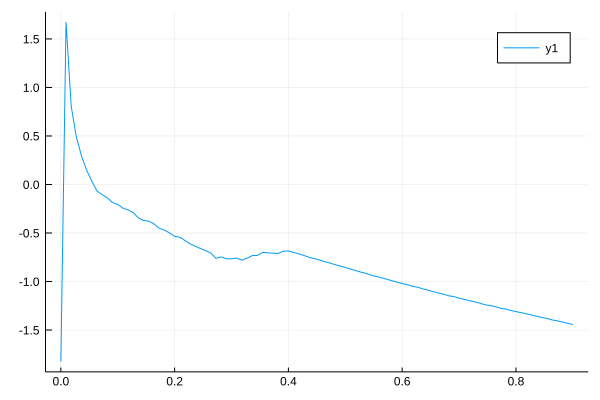

In [10]:
plot(k1_range,lyaps[1,:],)

In [13]:
using CSV
using DataFrames

In [14]:
df_lyaps = DataFrame(k1_range=k1_range, λa=lyaps[1,:], 
    λb=lyaps[2,:], λx=lyaps[3,:], λy=lyaps[4,:])

,k1_range,λa,λb,λx,λy
,Float64,Float64,Float64,Float64,Float64
1,0.0,-1.82608,-13.4413,3.75445,2.16266
2,0.00909091,1.67458,-8.32853,4.05526,2.68949
3,0.0181818,0.806393,-7.55254,4.033,2.59908
4,0.0272727,0.487955,-7.21476,4.01761,2.54821
5,0.0363636,0.292371,-6.96337,4.00538,2.50632
6,0.0454545,0.145107,-6.78403,3.99793,2.47441
7,0.0545455,0.0332354,-6.595,3.99174,2.44529
8,0.0636364,-0.0686498,-7.48105,3.74871,2.65125
9,0.0727273,-0.105193,-7.45737,3.71074,2.64814


In [15]:
CSV.write("sde_lyaps.csv",df_lyaps)

"ode_lyaps.csv"

In [27]:
# using DataFrames
# function traj_to_df(sol_sde)
#     t = sol_sde.t    
#     traj = np.transpose(sol_sde.u)  
#     as,bs,xs,ys = [rand(length(traj)) for i in 1:4]
#     trajs = []
#     for (i,param) in enumerate([as,bs,xs,ys])
#         param = traj[i,1:end]
#         push!(trajs, param)
#     end
#     df = DataFrame(as=trajs[1],bs=trajs[2],xs=trajs[3],ys=trajs[4]);
# end;

In [29]:
# df = traj_to_df(sol_sde);

In [30]:
# using CSV
# CSV.write("sol_sde.csv",df)

"sol_sde.csv"

In [ ]:
using UnicodePlots
unicodeplots()

In [304]:
using Colors

In [312]:
palette = distinguishable_colors(100)
palette
rand(palette,3,3)